In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from metric_dataloader import MetricDataPreprocessor
from hydra import initialize, compose
from omegaconf import OmegaConf

import torch

import plot_utils

In [2]:
# Get z space:

def get_checkpoint():
    with initialize(version_base=None, config_path="configs/"):
        config = compose(config_name='config.yaml')
        #print(OmegaConf.to_yaml(config))
    preproc = MetricDataPreprocessor(**config.data_preprocessor)
    train_loader, test_loader, val_loader = preproc.get_dataloaders()

    model_rve = torch.load(config.diffusion.checkpoint.path)
    return model_rve, train_loader, test_loader, val_loader

model, train_loader, test_loader, val_loader = get_checkpoint()

In [3]:
import json

train_dict = plot_utils.get_engine_runs(train_loader, model)
val_dict = plot_utils.get_engine_runs(val_loader, model)
test_dict = plot_utils.get_engine_runs(test_loader, model)

class NumpyEncoder(json.JSONEncoder):
    """ Special json encoder for numpy types """
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return json.JSONEncoder.default(self, obj)


with open('./outputs/train_dict.json', 'w') as fp:
    json.dump(train_dict, fp, cls=NumpyEncoder)

with open('./outputs/val_dict.json', 'w') as fp:
    json.dump(val_dict, fp, cls=NumpyEncoder)

with open('./outputs/test_dict.json', 'w') as fp:
    json.dump(test_dict, fp, cls=NumpyEncoder)



In [4]:
val_dict.keys()

dict_keys([4, 10, 12, 18, 22, 30, 31, 33, 39, 44, 45, 53, 70, 73, 76, 77, 80, 83, 90])

In [5]:
test_dict.keys()

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100])

In [6]:
train_dict[1]

{'rul': array([125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 125., 125., 125., 125., 125., 125., 125.,
        125., 125., 125., 125., 124., 123., 122., 121., 120., 119., 118.,
        117., 116., 115., 114., 113., 112., 111., 110., 109., 108., 107.,
        106., 105., 104., 103., 102., 101., 100.,  99.,  98.,  97.,  96.,
         95.,  94.,  93.,  92.,  91.,  90.,  89.,  88.,  87.,  86.,  85.,
         84.,  83.,  82.,  81.,

In [7]:
with open('./outputs/train_dict.json') as fp:
    train_dict_loaded = json.load(fp)
print(len(train_dict_loaded["1"]["rul"]))
print(len(train_dict_loaded["1"]["z"]))

print(train_dict_loaded["1"]["rul"][-1])
print(train_dict_loaded["1"]["z"][-1])

with open('./outputs/val_dict.json') as fp:
    val_dict_loaded = json.load(fp)
print(len(val_dict_loaded["4"]["rul"]))
print(len(val_dict_loaded["4"]["z"]))

with open('./outputs/test_dict.json') as fp:
    test_dict_loaded = json.load(fp)
print(len(test_dict_loaded["4"]["rul"]))
print(len(test_dict_loaded["4"]["z"]))

228
228
0.0
[1.0753158330917358, -1.1434166431427002]
241
241
1
1


In [8]:
val_dict_loaded["4"].keys()

dict_keys(['rul', 'rul_hat', 'z'])

In [2]:
def get_checkpoint():
    with initialize(version_base=None, config_path="configs/"):
        config = compose(config_name='config.yaml')
        #print(OmegaConf.to_yaml(config))
    preproc = MetricDataPreprocessor(**config.data_preprocessor)
    train_loader, test_loader, val_loader = preproc.get_dataloaders()

    model_rve = torch.load(config.finetuner.checkpoint.path)
    return model_rve, train_loader, test_loader, val_loader

In [3]:
model, train_loader, test_loader, val_loader = get_checkpoint()

In [4]:
model

RVEAttention_MH(
  (decoder): Decoder(
    (lstm_to_hidden): LSTM(2, 256, batch_first=True)
    (dropout_layer): Dropout(p=0.5, inplace=False)
    (lstm_to_output): LSTM(256, 21, batch_first=True)
  )
  (encoder): Encoder(
    (lstm): LSTM(21, 256, batch_first=True)
    (fc_mean): Sequential(
      (0): Dropout(p=0.5, inplace=False)
      (1): Linear(in_features=256, out_features=2, bias=True)
    )
    (fc_log_var): Sequential(
      (0): Dropout(p=0.5, inplace=False)
      (1): Linear(in_features=256, out_features=2, bias=True)
    )
  )
  (self_attention): MultiheadAttention(
    (out_proj): NonDynamicallyQuantizableLinear(in_features=30, out_features=30, bias=True)
  )
  (batchnorm): BatchNorm1d(21, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
  (regressor): Sequential(
    (0): Linear(in_features=2, out_features=100, bias=True)
    (1): Tanh()
    (2): Dropout(p=0.8, inplace=False)
    (3): Linear(in_features=100, out_features=1, bias=True)
  )
)

In [5]:
z, y, y_hat = plot_utils.get_z(model, val_loader)

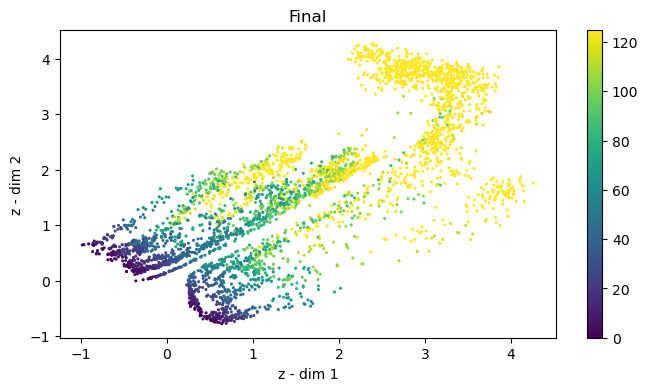

In [6]:
plot_utils.viz_latent_space(z, y, save=False, show=True)

In [8]:
plot_utils.get_test_score(model, val_loader)
plot_utils.get_test_score(model, test_loader)

RMSE: 12.756 Score: 12249.491
RMSE: 11.416 Score: 238.560


(238.5595703125, 11.415766845289703)

In [10]:
history = plot_utils.get_engine_runs(val_loader, model)

In [11]:
val_ids = list(history.keys())
val_ids

[4, 10, 12, 18, 22, 30, 31, 33, 39, 44, 45, 53, 70, 73, 76, 77, 80, 83, 90]

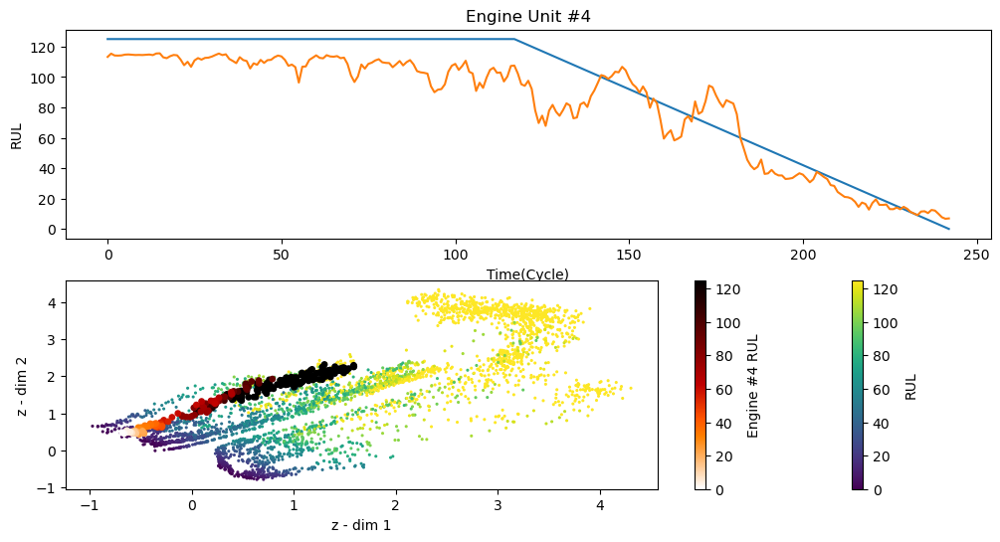

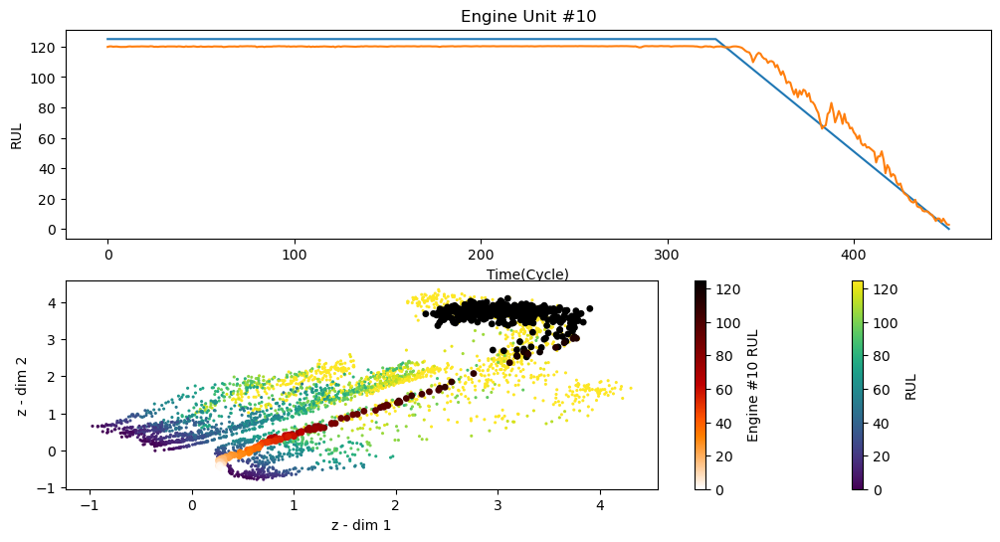

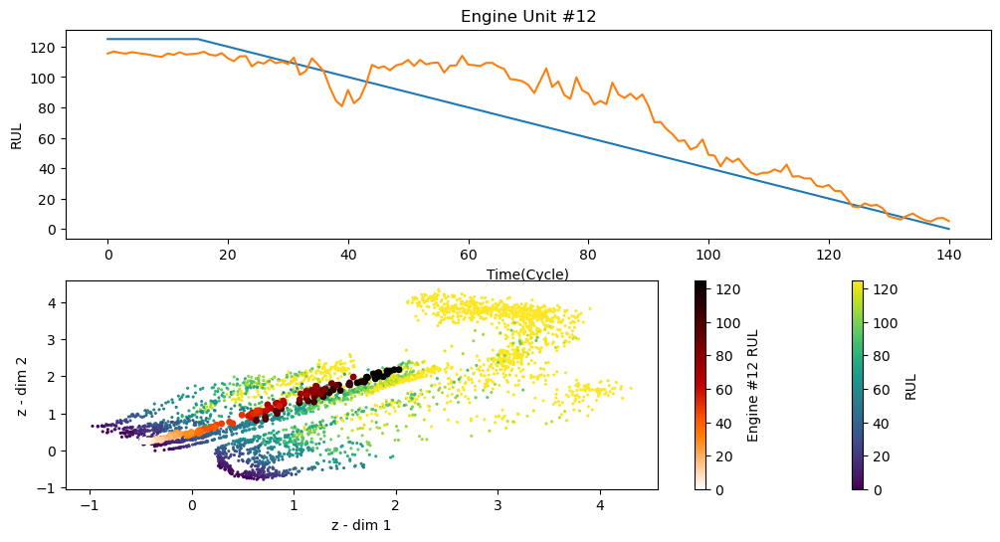

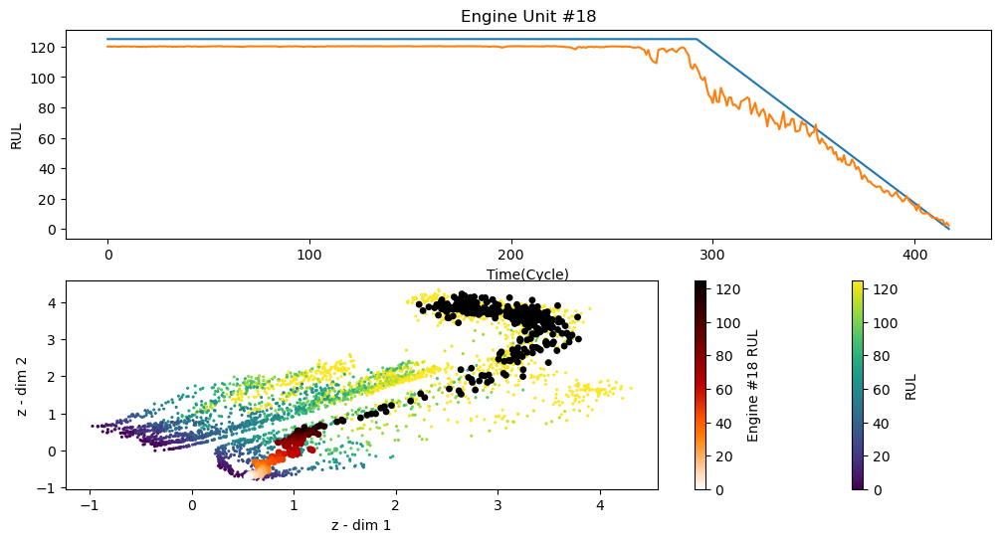

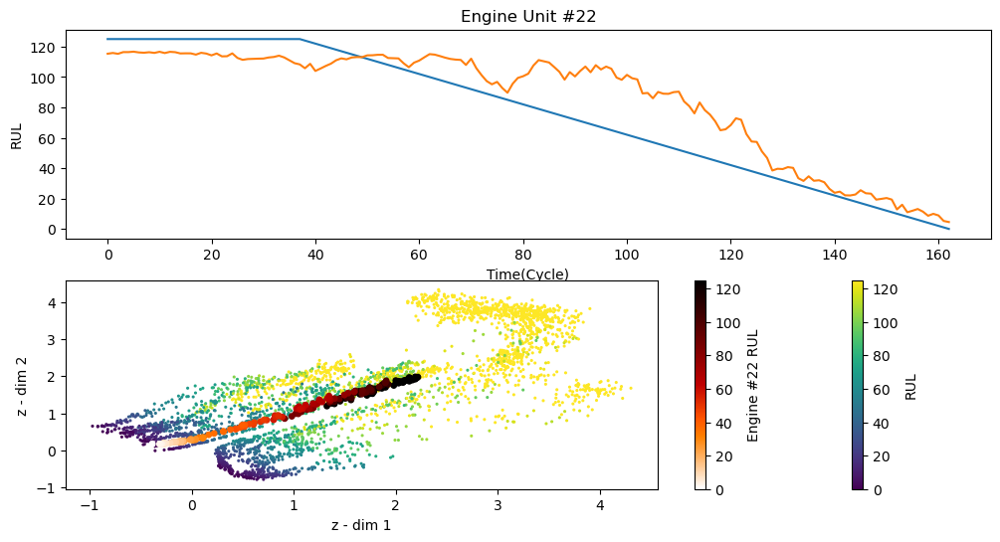

...

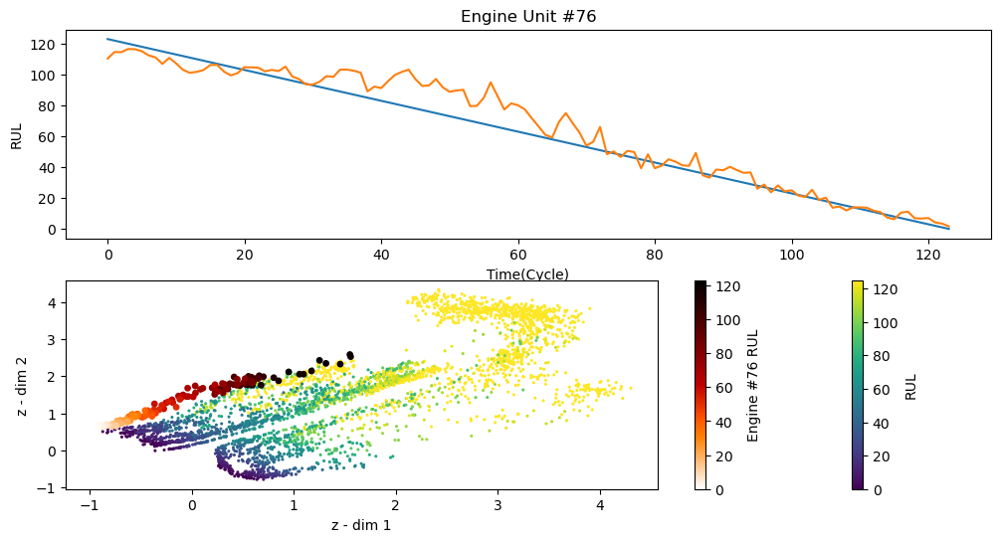

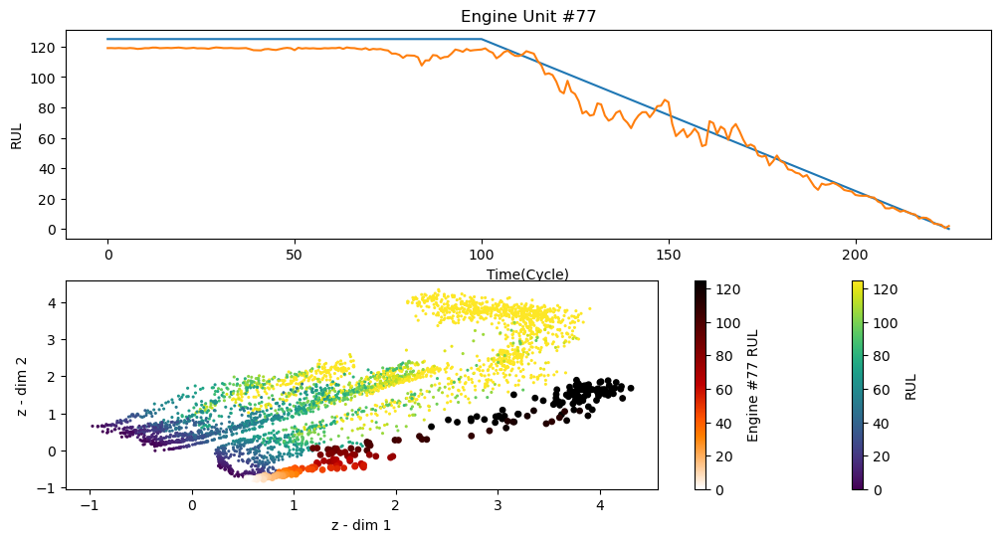

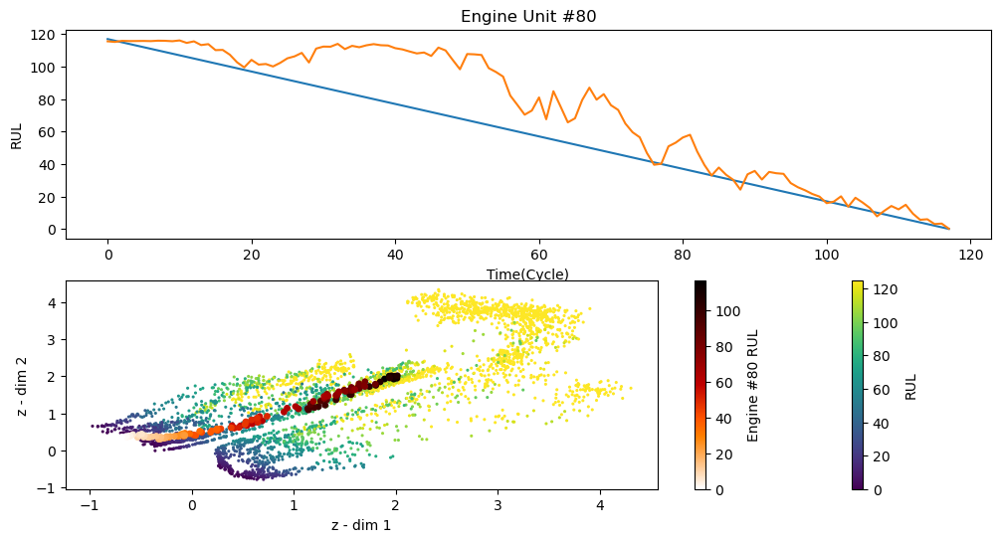

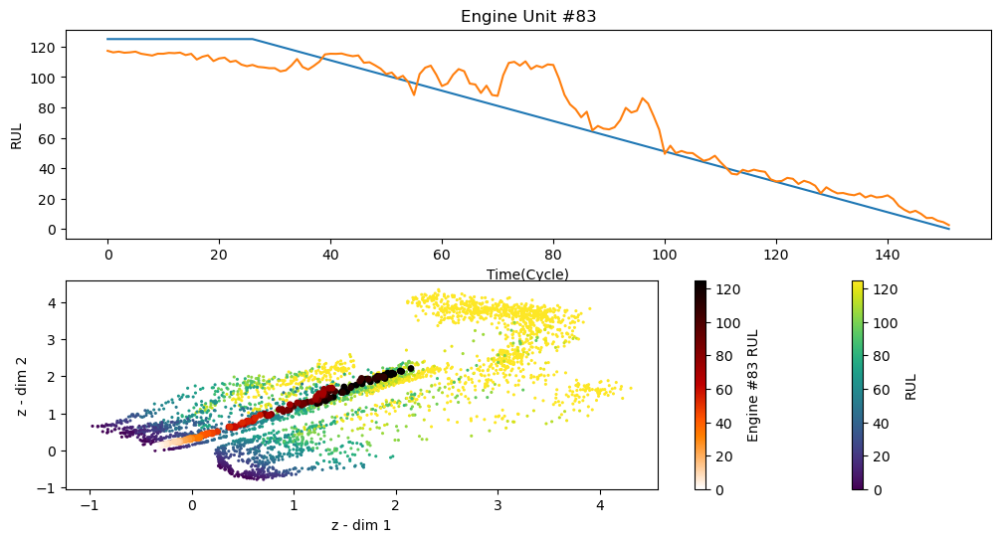

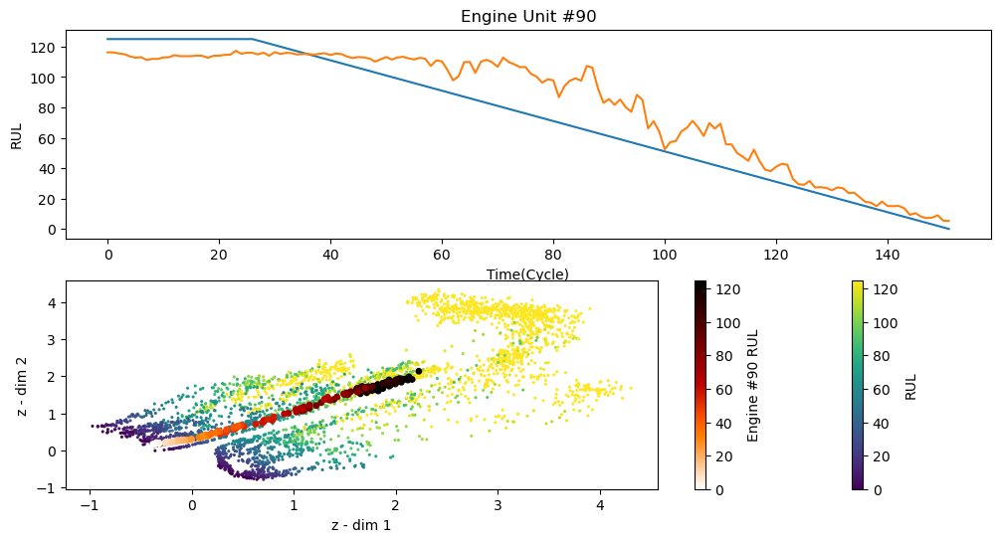

In [12]:
for key in history.keys():
    plot_utils.plot_engine_run(history, key)

In [12]:
index_names = ['Engine ID', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i + 1) for i in range(0, 21)]
#sensors = ['s_7','s_12']
sensors = sensor_names
col_names = index_names + setting_names + sensor_names
# remove unused sensors
drop_sensors = [element for element in sensor_names if element not in sensors]

train_file = './CMAPSSData/train_FD003.txt'

# data readout
train = pd.read_csv(train_file, sep=r'\s+', header=None,names=col_names)
train.drop(drop_sensors,axis=1, inplace=True)
df = train[train["Engine ID"].isin(val_ids)]
dff = df.copy()

In [25]:
def engine_grouping(x):
    # two groups within 1 fault mode:
    group_1 = [45, 73, 10]
    group_2 = [18, 33, 39, 77]
    if int(x["Engine ID"]) in group_1:
        return 1
    elif int(x["Engine ID"]) in group_2:
        return 2
    else:
        return 0

In [27]:
dff["group"] = dff.apply(engine_grouping, axis=1)
dff.head()

,Engine ID,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21,group
734,4,1,0.0019,-0.0004,100.0,518.67,642.03,1587.05,1414.42,14.62,...,2388.07,8130.24,8.4466,0.03,393,2388,100.0,38.64,23.2980,0
735,4,2,0.0056,0.0003,100.0,518.67,643.28,1587.31,1412.80,14.62,...,2388.17,8122.84,8.4382,0.03,394,2388,100.0,38.97,23.3651,0
736,4,3,-0.0020,0.0001,100.0,518.67,642.52,1586.97,1412.14,14.62,...,2388.14,8130.10,8.4747,0.03,392,2388,100.0,38.72,23.2927,0
737,4,4,-0.0001,-0.0001,100.0,518.67,642.07,1595.43,1411.36,14.62,...,2388.11,8127.78,8.4948,0.03,393,2388,100.0,38.73,23.2552,0
738,4,5,0.0029,-0.0003,100.0,518.67,643.07,1588.47,1410.30,14.62,...,2388.06,8127.20,8.3955,0.03,393,2388,100.0,38.73,23.2215,0


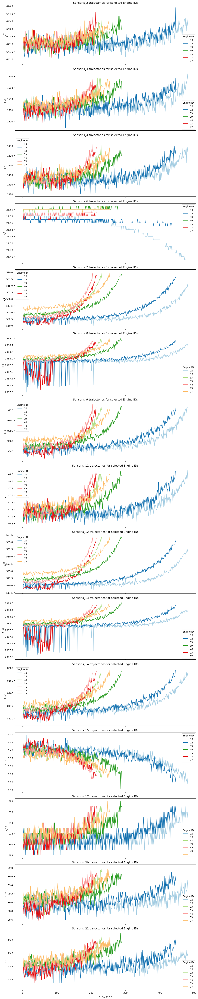

In [39]:
sensor_subset = ["s_2", "s_3", "s_4", "s_6", "s_7", "s_8", "s_9", "s_11", "s_12", "s_13", "s_14", "s_15", "s_17", "s_20", "s_21"]
engine_id_subset = [45, 73, 10, 18, 33, 39, 77]
dff_subset = dff[dff["Engine ID"].isin(engine_id_subset)]

fig , ax = plt.subplots(len(sensor_subset),1, sharex=True, figsize=(12, 4*len(sensor_subset)))
for i, sensor in enumerate(sensor_subset):
    sns.lineplot(
        data=dff_subset,
        x="time_cycles", y=sensor,
        hue="Engine ID", ax=ax[i], palette="Paired"
    ).set_title(f'Sensor {sensor} trajectories for selected Engine IDs')
plt.tight_layout()

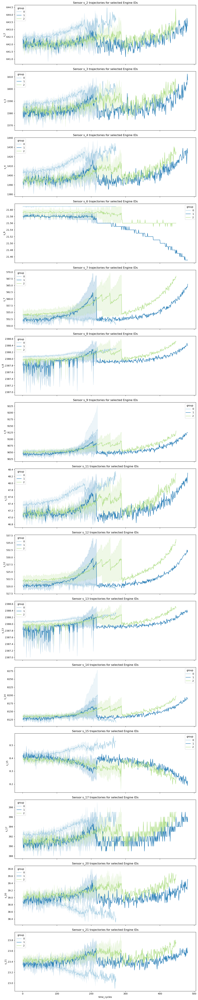

In [38]:
sensor_subset = ["s_2", "s_3", "s_4", "s_6", "s_7", "s_8", "s_9", "s_11", "s_12", "s_13", "s_14", "s_15", "s_17", "s_20", "s_21"]
fig , ax = plt.subplots(len(sensor_subset),1, sharex=True, figsize=(12, 4*len(sensor_subset)))
for i, sensor in enumerate(sensor_subset):
    sns.lineplot(
        data=dff,
        x="time_cycles", y=sensor,
        hue="group", ax=ax[i], palette="Paired"
    ).set_title(f'Sensor {sensor} trajectories for selected Engine IDs')
plt.tight_layout()

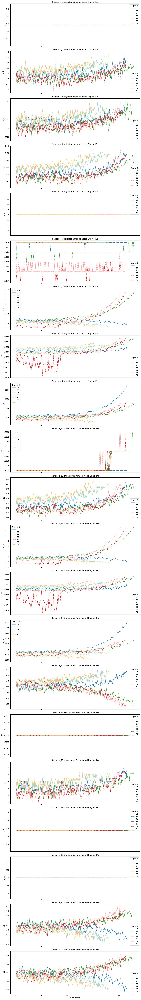

In [9]:

fig , ax = plt.subplots(len(sensors),1, sharex=True, figsize=(12, 4*len(sensors)))
for i, sensor in enumerate(sensors):
    sns.lineplot(
        data=dff,
        x="time_cycles", y=sensor,
        hue="Engine ID",ax=ax[i], style="Engine ID", palette="Paired"
    ).set_title(f'Sensor {sensor} trajectories for selected Engine IDs')
plt.tight_layout()